# Valmet Sensor Data Analysis

## Problem Statement

The objective of this analysis is to understand the factors influencing paper roughness (Sensor Name: Roughness) and develop a predictive model for it. Roughness is a critical quality measurement taken in the laboratory for each paper roll produced. However, the factory is interested in predicting roughness based on sensor data.

The primary goals are as follows:

1. Identify the key variables that impact Roughness.
2. Create a quantitative model that correlates Roughness with variables like 'Dry Weight,' 'Moisture 1,' 'Moisture 2,' 'Coat Weight 1,' 'Basis Weight,' and others.
3. Assess the accuracy of the predictive model.

## Approaches

Two distinct approaches were employed to address missing data and construct predictive models:

### Approach 1: Handling Missing Values

In this approach, we chose to remove all missing values from the 'Roughness' variable. The steps included:

1. Data preprocessing to manage missing data.
2. Utilizing Recursive Feature Elimination (RFE) to identify crucial features.
3. Employing Linear Regression to establish the predictive model.
4. Evaluating model performance through Mean Squared Error (MSE) and statistical metrics (R-Squared, P-Value).

### Approach 2: Interpolation of Missing Values

In this alternative approach, we opted to interpolate missing values in the 'Roughness' variable. The key steps involved:

1. Data preprocessing with interpolation techniques.
2. Implementing Recursive Feature Elimination (RFE) to select pertinent features.
3. Constructing a Linear Regression model.
4. Model evaluation based on Mean Squared Error (MSE) and statistical indicators (R-Squared, P-Value).

The outcomes of both approaches were analyzed to determine the most effective strategy for handling missing data and building a precise predictive model for paper roughness.

### Approach 3: Random Forest Regression

This approach yielded a relatively better outcome with an R-squared value of 0.7077 and MSE of 0.0297. Feature importances were also examined.


## Recommendations

Drawing from the insights and model outcomes, we can propose recommendations for enhancing paper roughness. Although it is not a very good fit of the moddel with very low **R-Squared** and high **P-Value**. 

Additionally, suggestions for refining the model's performance are also provided.

Here is the linear model equation:
<font color="blue"> 
$ \text{Roughness} = 4.38 - 0.000491 \times \text{Dry Weight} - 0.100099 \times \text{Moisture 2} - 0.018054 \times \text{Coat Weight 1} - 0.118931 \times \text{Filler Amount} + 0.000038 \times \text{Nipload} + 0.001608 \times \text{Press Control} + 0.000043 \times \text{Speed} - 0.004499 \times \text{Dryer Control 2} + 0.000149 \times \text{Water Flow} $</font>

But the **Random Forest Regression** gave a better model and the features coefficients are
Feature Importances:
- Dry Weight: 0.0882
- Moisture 1: 0.0594
- Moisture 2: 0.0863
- Coat Weight 1: 0.0623
- Basis Weight: 0.1296
- Coat Weight 2: 0.0575
- Filler Flume Consistency: 0.0788
- Dryer Control 1: 0.0335
- Filler Amount: 0.0080
- Nipload: 0.1725
- Press Control: 0.0402
- Speed: 0.1048
- Dryer Control 2: 0.0392
- Water Flow: 0.0397


It is acknowledged that there is potential for improvement, and the following options are considered:

1. **Feature Engineering**: Add new features that could better capture the relationships in the data.
2. **Non-Linear Models**: Explore the application of non-linear regression models for improved predictive performance.



In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import the numpy and pandas package
import numpy as np
import pandas as pd

In [3]:
paper= pd.read_csv("Dataset Valmet_sensor_data.csv")
paper.head()

,Time,Dry Weight,Moisture 1,Moisture 2,Coat Weight 1,Basis Weight,Coat Weight 2,Roughness,Filler Flume Consistency,Dryer Control 1,Filler Amount,Nipload,Press Control,Speed,Dryer Control 2,Water Flow
0,1.6.2020 0:00,57.982088,8.063702,NaN,5.931029,NaN,1.700335,NaN,0.105449,31.015667,0.3,178.076936,36.149757,1851.000000,32.600708,854.665300
1,1.6.2020 0:10,57.938079,7.906487,NaN,5.964949,NaN,1.700671,NaN,0.105300,30.804412,0.3,178.018339,35.888979,1851.000000,32.451856,754.036580
2,1.6.2020 0:20,57.977710,7.952795,6.24,5.943388,63.81,1.700528,4.11,0.103361,30.592229,0.3,177.897150,35.674022,1851.000000,32.179806,666.882218
3,1.6.2020 0:30,57.995342,8.052985,NaN,5.931491,NaN,1.700883,NaN,0.101526,30.447916,0.3,178.248232,35.557136,1851.000000,32.029520,629.219831
4,1.6.2020 0:40,57.997410,7.950365,NaN,5.942987,NaN,1.700414,NaN,0.100664,30.290527,0.3,178.259663,35.394812,1851.341017,31.896607,652.959524


##### Inspecting the various aspects of the housing dataframe

In [4]:
paper.shape

(22032, 16)

In [5]:
paper.describe()

,Dry Weight,Moisture 1,Moisture 2,Coat Weight 1,Basis Weight,Coat Weight 2,Roughness,Filler Flume Consistency,Dryer Control 1,Filler Amount,Nipload,Press Control,Speed,Dryer Control 2,Water Flow
count,18168.000000,18168.000000,5145.000000,18168.000000,5151.000000,18168.000000,5122.000000,18161.000000,18163.000000,18161.000000,18168.000000,18163.000000,18168.000000,18163.000000,18161.000000
mean,68.794898,9.432799,5.985694,5.971968,75.041971,1.684291,3.659213,0.098344,46.648273,0.307115,230.360910,54.440221,1666.284429,49.101771,741.469224
std,10.344842,1.158316,0.355352,0.709871,10.061437,0.197523,0.303253,0.031916,18.417808,0.017467,55.234952,21.566466,234.609112,19.386018,102.469674
min,0.000000,0.000000,3.633333,-4.755585,55.560000,0.000000,0.000000,0.042445,2.727221,0.300000,0.000000,3.221973,1063.992899,2.871126,65.901291
25%,58.989208,8.525597,5.758333,5.705365,64.245238,1.599904,3.476042,0.072789,31.469119,0.300000,183.020189,36.709530,1503.433833,33.133554,674.248421
50%,66.645267,9.452947,5.941666,5.909700,72.550000,1.600755,3.650000,0.096728,45.331152,0.300000,222.959497,52.895011,1661.014222,47.715976,734.078965
75%,77.828259,10.066291,6.183333,6.142385,84.150000,1.778943,3.830160,0.118153,60.433554,0.300000,270.897037,70.531808,1880.839317,63.622659,793.883518
max,100.708463,23.198673,7.644736,37.938145,108.850000,2.600836,7.600000,0.223342,98.961860,0.350000,400.962569,167.753492,2076.436845,104.173191,1771.726735


In [6]:
paper.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22032 entries, 0 to 22031
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Time                      22032 non-null  object 
 1   Dry Weight                18168 non-null  float64
 2   Moisture 1                18168 non-null  float64
 3   Moisture 2                5145 non-null   float64
 4   Coat Weight 1             18168 non-null  float64
 5   Basis Weight              5151 non-null   float64
 6   Coat Weight 2             18168 non-null  float64
 7   Roughness                 5122 non-null   float64
 8   Filler Flume Consistency  18161 non-null  float64
 9   Dryer Control 1           18163 non-null  float64
 10  Filler Amount             18161 non-null  float64
 11  Nipload                   18168 non-null  float64
 12  Press Control             18163 non-null  float64
 13  Speed                     18168 non-null  float64
 14  Dryer 

<font color="blue"> **Moisture 2, Basis Weight, and Roughness** have less number of data. It seems it is periodic data.
And Roughness is the target variable</font>


In [7]:
# Make a copy of the original data. 
df=paper.copy()
df.head()

,Time,Dry Weight,Moisture 1,Moisture 2,Coat Weight 1,Basis Weight,Coat Weight 2,Roughness,Filler Flume Consistency,Dryer Control 1,Filler Amount,Nipload,Press Control,Speed,Dryer Control 2,Water Flow
0,1.6.2020 0:00,57.982088,8.063702,NaN,5.931029,NaN,1.700335,NaN,0.105449,31.015667,0.3,178.076936,36.149757,1851.000000,32.600708,854.665300
1,1.6.2020 0:10,57.938079,7.906487,NaN,5.964949,NaN,1.700671,NaN,0.105300,30.804412,0.3,178.018339,35.888979,1851.000000,32.451856,754.036580
2,1.6.2020 0:20,57.977710,7.952795,6.24,5.943388,63.81,1.700528,4.11,0.103361,30.592229,0.3,177.897150,35.674022,1851.000000,32.179806,666.882218
3,1.6.2020 0:30,57.995342,8.052985,NaN,5.931491,NaN,1.700883,NaN,0.101526,30.447916,0.3,178.248232,35.557136,1851.000000,32.029520,629.219831
4,1.6.2020 0:40,57.997410,7.950365,NaN,5.942987,NaN,1.700414,NaN,0.100664,30.290527,0.3,178.259663,35.394812,1851.341017,31.896607,652.959524


In [8]:
# Create separate columns for Date, Month, Year, Hour, and Minute
#paper['Time'] = pd.to_datetime(paper['Time'], format='%d.%m.%Y %H:%M')

##### Gave an error

In [9]:
try:
    df['Time'] = pd.to_datetime(paper['Time'], format='%d.%m.%Y %H:%M')
except ValueError as e:
    # Handle the error here
    print("ValueError: day is out of range for month")

    # Find the Error values and their index locations
    problematic_values = df['Time'][pd.to_datetime(paper['Time'], format='%d.%m.%Y %H:%M', errors='coerce').isna()]
    problematic_indices = problematic_values.index

    print("Problematic values:")
    print(problematic_values.head())
    print("Problematic indices:")
    print(problematic_indices)

ValueError: day is out of range for month
Problematic values:
17424    31.9.2020 0:00
17425    31.9.2020 0:10
17426    31.9.2020 0:20
17427    31.9.2020 0:30
17428    31.9.2020 0:40
Name: Time, dtype: object
Problematic indices:
Int64Index([17424, 17425, 17426, 17427, 17428, 17429, 17430, 17431, 17432,
            17433,
            ...
            17558, 17559, 17560, 17561, 17562, 17563, 17564, 17565, 17566,
            17567],
           dtype='int64', length=144)


#### It seems oneday (31.09.2020) value have been wrongly dated. 

### Approach 1, Deleting the missing value from the target 'Roughness' 

#### Data Cleaning

In [10]:
# Lets drop all null values of Roughness
df.dropna(subset=['Roughness'], inplace=True)
df.shape

(5122, 16)

In [11]:
df.isnull().sum() 

Time                         0
Dry Weight                  69
Moisture 1                  69
Moisture 2                   7
Coat Weight 1               69
Basis Weight                 3
Coat Weight 2               69
Roughness                    0
Filler Flume Consistency    71
Dryer Control 1             69
Filler Amount               71
Nipload                     69
Press Control               69
Speed                       69
Dryer Control 2             69
Water Flow                  71
dtype: int64

<font color="red"> Still some mising values are there </font>

##### 'Water Flow ' has maximum missing values
So drop the missing values of Water Flow 

In [12]:
df.dropna(subset=['Water Flow'], inplace=True)
df.isnull().sum()

Time                        0
Dry Weight                  0
Moisture 1                  0
Moisture 2                  7
Coat Weight 1               0
Basis Weight                3
Coat Weight 2               0
Roughness                   0
Filler Flume Consistency    0
Dryer Control 1             0
Filler Amount               0
Nipload                     0
Press Control               0
Speed                       0
Dryer Control 2             0
Water Flow                  0
dtype: int64

In [13]:
df.dropna(subset=['Moisture 2'], inplace=True)
df.isnull().sum()

Time                        0
Dry Weight                  0
Moisture 1                  0
Moisture 2                  0
Coat Weight 1               0
Basis Weight                0
Coat Weight 2               0
Roughness                   0
Filler Flume Consistency    0
Dryer Control 1             0
Filler Amount               0
Nipload                     0
Press Control               0
Speed                       0
Dryer Control 2             0
Water Flow                  0
dtype: int64

In [14]:
#Check the statistical difference with the original data
paper.describe()

,Dry Weight,Moisture 1,Moisture 2,Coat Weight 1,Basis Weight,Coat Weight 2,Roughness,Filler Flume Consistency,Dryer Control 1,Filler Amount,Nipload,Press Control,Speed,Dryer Control 2,Water Flow
count,18168.000000,18168.000000,5145.000000,18168.000000,5151.000000,18168.000000,5122.000000,18161.000000,18163.000000,18161.000000,18168.000000,18163.000000,18168.000000,18163.000000,18161.000000
mean,68.794898,9.432799,5.985694,5.971968,75.041971,1.684291,3.659213,0.098344,46.648273,0.307115,230.360910,54.440221,1666.284429,49.101771,741.469224
std,10.344842,1.158316,0.355352,0.709871,10.061437,0.197523,0.303253,0.031916,18.417808,0.017467,55.234952,21.566466,234.609112,19.386018,102.469674
min,0.000000,0.000000,3.633333,-4.755585,55.560000,0.000000,0.000000,0.042445,2.727221,0.300000,0.000000,3.221973,1063.992899,2.871126,65.901291
25%,58.989208,8.525597,5.758333,5.705365,64.245238,1.599904,3.476042,0.072789,31.469119,0.300000,183.020189,36.709530,1503.433833,33.133554,674.248421
50%,66.645267,9.452947,5.941666,5.909700,72.550000,1.600755,3.650000,0.096728,45.331152,0.300000,222.959497,52.895011,1661.014222,47.715976,734.078965
75%,77.828259,10.066291,6.183333,6.142385,84.150000,1.778943,3.830160,0.118153,60.433554,0.300000,270.897037,70.531808,1880.839317,63.622659,793.883518
max,100.708463,23.198673,7.644736,37.938145,108.850000,2.600836,7.600000,0.223342,98.961860,0.350000,400.962569,167.753492,2076.436845,104.173191,1771.726735


In [15]:
df.describe()

,Dry Weight,Moisture 1,Moisture 2,Coat Weight 1,Basis Weight,Coat Weight 2,Roughness,Filler Flume Consistency,Dryer Control 1,Filler Amount,Nipload,Press Control,Speed,Dryer Control 2,Water Flow
count,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000,5044.000000
mean,69.181221,9.424196,5.985273,5.968932,75.159029,1.685968,3.657864,0.098314,47.578502,0.307534,231.810503,55.532609,1667.063958,50.083541,738.516281
std,10.111239,1.141542,0.357340,0.753459,10.111707,0.171161,0.303928,0.031917,18.316215,0.017888,55.256592,21.446548,232.114400,19.278311,95.021225
min,0.000000,0.000000,3.633333,1.652846,55.850000,0.000000,0.000000,0.042445,2.835565,0.300000,0.000000,3.283298,1063.992899,3.107441,420.677140
25%,59.173804,8.522151,5.757142,5.702025,64.128750,1.599900,3.473428,0.072569,32.555398,0.300000,187.559287,37.964599,1504.678331,34.285609,672.397312
50%,67.412068,9.467969,5.941666,5.898244,73.725000,1.600669,3.650000,0.096652,46.341415,0.300000,223.314869,54.070100,1661.413158,48.805521,731.281552
75%,77.903499,10.059118,6.183333,6.132512,84.216964,1.754340,3.830354,0.118144,61.220060,0.300000,272.323794,71.468978,1880.220100,64.447118,792.335047
max,100.603260,23.198673,7.644736,37.867449,108.850000,2.599714,7.600000,0.219387,98.832571,0.350000,400.876241,167.753492,2069.813343,103.988897,1516.188919


###  Visualising the Data

**Understanding the data**.
- If there is some obvious multicollinearity going on, this is the first place to catch it

to visualise the data we need `matplotlib` and `seaborn`.

In [16]:
df.drop(columns='Time', inplace=True, axis=1)
df.shape

(5044, 15)

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

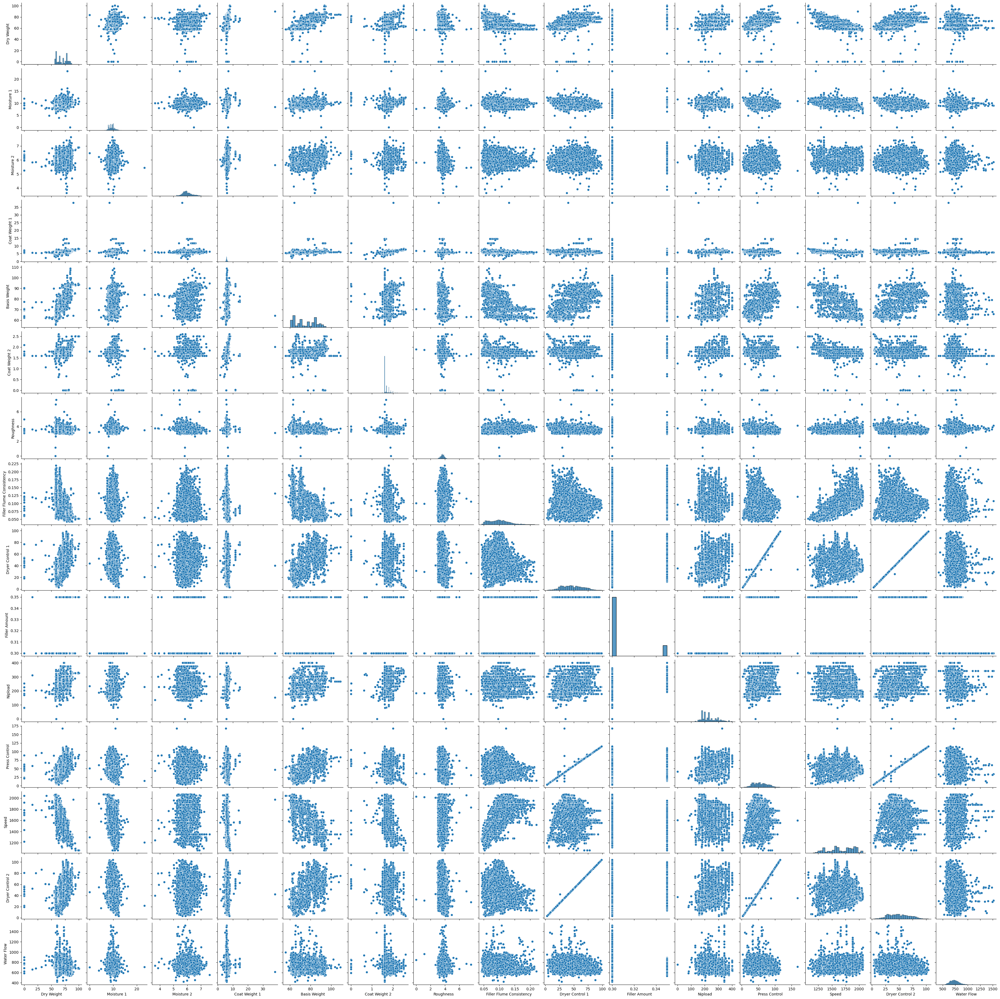

In [18]:
sns.pairplot(df)
plt.show()

##### Dryer Control 1, Dryer Control 2 and Press Control have strong colinearity. 

### Splitting the Data into Training and Testing Sets

With a train-test split.

In [19]:
y = df['Roughness']
X = df.drop(['Roughness'], axis=1)

In [20]:
# Splitting the data into train and test
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

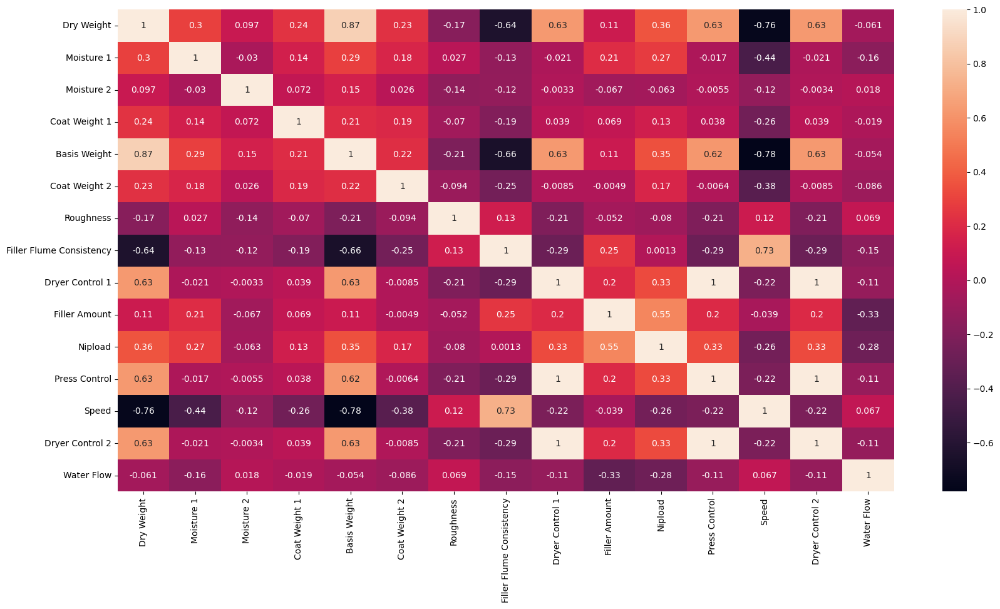

In [21]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(df.corr(),annot = True)
plt.show()

#### Highly correlated(positive and negative) entries are
- Dryer Control 1
- Filler Flume Consistency
- Basis Weight
- Moisture 1
- Coat Weight 2


##  Building a linear model

In [22]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

# Initialize the linear regression model
lm = LinearRegression()
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
# Create the RFE object with the estimator (linear regression model) and the number of features to select (10)
rfe = RFE(estimator=lm, n_features_to_select=10)

# Fit the RFE object to your training data
rfe2 = rfe.fit(X_train, y_train)

In [23]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Dry Weight', True, 1),
 ('Moisture 1', True, 1),
 ('Moisture 2', True, 1),
 ('Coat Weight 1', True, 1),
 ('Basis Weight', True, 1),
 ('Coat Weight 2', True, 1),
 ('Filler Flume Consistency', True, 1),
 ('Dryer Control 1', True, 1),
 ('Filler Amount', True, 1),
 ('Nipload', False, 5),
 ('Press Control', False, 2),
 ('Speed', False, 4),
 ('Dryer Control 2', True, 1),
 ('Water Flow', False, 3)]

#### These are the top 10 important features 

<font color="blue"> Cheacking **Least Squares regression** for **R-Squared**, **P-Values** of all entries </font>

In [24]:
import statsmodels.api as sm

# Assuming you have X_train and y_train defined
X_train_with_const = sm.add_constant(X_train)  # Add a constant term (intercept) to the predictor variables
model = sm.OLS(y_train, X_train_with_const).fit()  # Create and fit the model

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              Roughness   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     25.56
Date:                Fri, 15 Sep 2023   Prob (F-statistic):           2.61e-64
Time:                        09:08:33   Log-Likelihood:                -546.69
No. Observations:                3530   AIC:                             1123.
Df Residuals:                    3515   BIC:                             1216.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

### <font color="blue"> R-squared is very low, and very high p-value</font>

In [25]:
X_test = X_test.drop(['Nipload'],1)
X_train = X_train.drop(['Nipload'],1)

In [26]:
# Assuming you have X_train and y_train defined
X_train_with_const = sm.add_constant(X_train)  # Add a constant term (intercept) to the predictor variables
model = sm.OLS(y_train, X_train_with_const).fit()  # Create and fit the model

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              Roughness   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     27.53
Date:                Fri, 15 Sep 2023   Prob (F-statistic):           5.06e-65
Time:                        09:08:33   Log-Likelihood:                -546.73
No. Observations:                3530   AIC:                             1121.
Df Residuals:                    3516   BIC:                             1208.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

#### As we know there are very high correlation anong data, therefore dropping few more features. 

In [27]:
X_test = X_test.drop(['Dryer Control 1','Filler Flume Consistency','Basis Weight','Moisture 1','Coat Weight 2'], 1)
X_train = X_train.drop(['Dryer Control 1','Filler Flume Consistency','Basis Weight','Moisture 1','Coat Weight 2'], 1)

#### Checking the Correlation Matrix
After dropping highly correlated variables now let's check the correlation matrix again.

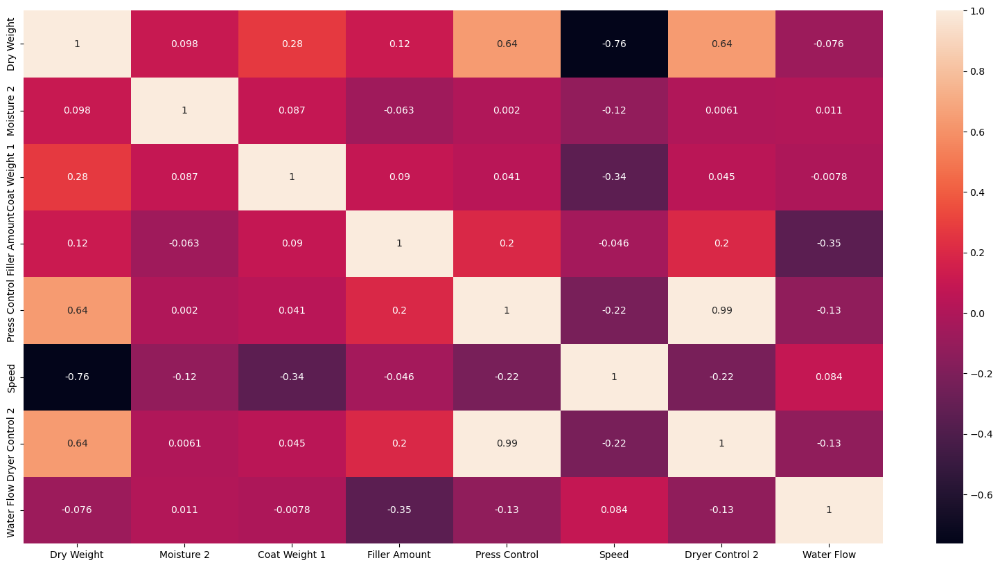

In [28]:
plt.figure(figsize = (20,10))
sns.heatmap(X_train.corr(),annot = True)
plt.show()

In [29]:
# Assuming you have X_train and y_train defined
X_train_with_const = sm.add_constant(X_train)  # Add a constant term (intercept) to the predictor variables
model = sm.OLS(y_train, X_train_with_const).fit()  # Create and fit the model

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              Roughness   R-squared:                       0.076
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     35.97
Date:                Fri, 15 Sep 2023   Prob (F-statistic):           3.53e-55
Time:                        09:08:34   Log-Likelihood:                -579.20
No. Observations:                3530   AIC:                             1176.
Df Residuals:                    3521   BIC:                             1232.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               4.2586      0.186     

In [30]:
model = LinearRegression()

# Fit the model on the training data
LR=model.fit(X_train, y_train)

In [31]:
from sklearn.metrics import mean_squared_error
# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)


Mean Squared Error: 0.09688473672681741


In [32]:
# Get the coefficients (weights) and intercept
coefficients = model.coef_  # Coefficients for each feature
intercept = model.intercept_  # Intercept (constant term)
# Assuming X_train is a pandas DataFrame
feature_names = X_train.columns
# Create a DataFrame for the summary table
summary_table = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Add a row for the intercept
summary_table = summary_table.append({'Feature': 'Intercept', 'Coefficient': intercept}, ignore_index=True)

# Print or display the summary table
print(summary_table)

           Feature  Coefficient
0       Dry Weight     0.001011
1       Moisture 2    -0.105001
2    Coat Weight 1    -0.019991
3    Filler Amount    -0.089174
4    Press Control     0.001394
5            Speed     0.000077
6  Dryer Control 2    -0.004900
7       Water Flow     0.000194
8        Intercept     4.258600


### Model Evaluation

Text(0, 0.5, 'y_pred')

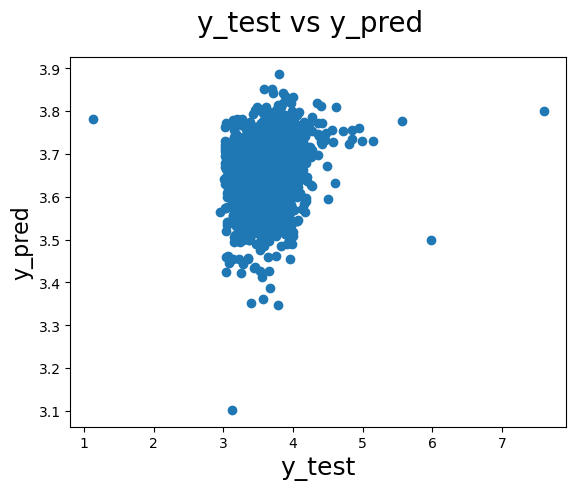

In [33]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16) 

## Approach 2:  Try with interpolation of missing data

In [34]:
df2=paper.copy()

In [35]:
df2.dropna(subset=['Water Flow','Press Control'], inplace=True)
df2.isnull().sum()

Time                            0
Dry Weight                      0
Moisture 1                      0
Moisture 2                  13082
Coat Weight 1                   0
Basis Weight                13076
Coat Weight 2                   0
Roughness                   13105
Filler Flume Consistency        0
Dryer Control 1                 0
Filler Amount                   0
Nipload                         0
Press Control                   0
Speed                           0
Dryer Control 2                 0
Water Flow                      0
dtype: int64

In [36]:
df2.drop(columns='Time', inplace=True, axis=1)
df2.shape

(18156, 15)

In [37]:
df2 = df2.drop([0, 1])
df2.head()

,Dry Weight,Moisture 1,Moisture 2,Coat Weight 1,Basis Weight,Coat Weight 2,Roughness,Filler Flume Consistency,Dryer Control 1,Filler Amount,Nipload,Press Control,Speed,Dryer Control 2,Water Flow
2,57.977710,7.952795,6.24,5.943388,63.81,1.700528,4.11,0.103361,30.592229,0.3,177.897150,35.674022,1851.000000,32.179806,666.882218
3,57.995342,8.052985,NaN,5.931491,NaN,1.700883,NaN,0.101526,30.447916,0.3,178.248232,35.557136,1851.000000,32.029520,629.219831
4,57.997410,7.950365,NaN,5.942987,NaN,1.700414,NaN,0.100664,30.290527,0.3,178.259663,35.394812,1851.341017,31.896607,652.959524
5,57.880703,7.907008,6.14,5.917358,62.59,1.699691,4.19,0.100094,29.972782,0.3,178.253276,34.901581,1852.292203,31.507010,680.382801
6,57.832647,7.964192,NaN,5.916992,NaN,1.700253,NaN,0.100733,30.124591,0.3,178.238649,34.934370,1865.314312,31.585101,667.462053


In [38]:
df2 = df2.reset_index(drop=True)

In [39]:
periodic_entry=["Moisture 2", "Basis Weight", "Roughness"]
paper_intr= df2[periodic_entry]
paper_intr.shape

(18154, 3)

#### <font color="green"> Filling in missing values in the DataFrame by estimating them based on the values of neighboring data points using linear interpolation. </font> 

In [40]:
paper_intr= paper_intr.interpolate(method='linear')

In [41]:
df2[["Moisture 2", "Basis Weight", "Roughness"]]= paper_intr[["Moisture 2", "Basis Weight", "Roughness"]]
df2.head()

,Dry Weight,Moisture 1,Moisture 2,Coat Weight 1,Basis Weight,Coat Weight 2,Roughness,Filler Flume Consistency,Dryer Control 1,Filler Amount,Nipload,Press Control,Speed,Dryer Control 2,Water Flow
0,57.977710,7.952795,6.240000,5.943388,63.810000,1.700528,4.110000,0.103361,30.592229,0.3,177.897150,35.674022,1851.000000,32.179806,666.882218
1,57.995342,8.052985,6.206667,5.931491,63.403333,1.700883,4.136667,0.101526,30.447916,0.3,178.248232,35.557136,1851.000000,32.029520,629.219831
2,57.997410,7.950365,6.173333,5.942987,62.996667,1.700414,4.163333,0.100664,30.290527,0.3,178.259663,35.394812,1851.341017,31.896607,652.959524
3,57.880703,7.907008,6.140000,5.917358,62.590000,1.699691,4.190000,0.100094,29.972782,0.3,178.253276,34.901581,1852.292203,31.507010,680.382801
4,57.832647,7.964192,6.133333,5.916992,62.620000,1.700253,4.193333,0.100733,30.124591,0.3,178.238649,34.934370,1865.314312,31.585101,667.462053


In [42]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18154 entries, 0 to 18153
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Dry Weight                18154 non-null  float64
 1   Moisture 1                18154 non-null  float64
 2   Moisture 2                18154 non-null  float64
 3   Coat Weight 1             18154 non-null  float64
 4   Basis Weight              18154 non-null  float64
 5   Coat Weight 2             18154 non-null  float64
 6   Roughness                 18154 non-null  float64
 7   Filler Flume Consistency  18154 non-null  float64
 8   Dryer Control 1           18154 non-null  float64
 9   Filler Amount             18154 non-null  float64
 10  Nipload                   18154 non-null  float64
 11  Press Control             18154 non-null  float64
 12  Speed                     18154 non-null  float64
 13  Dryer Control 2           18154 non-null  float64
 14  Water 

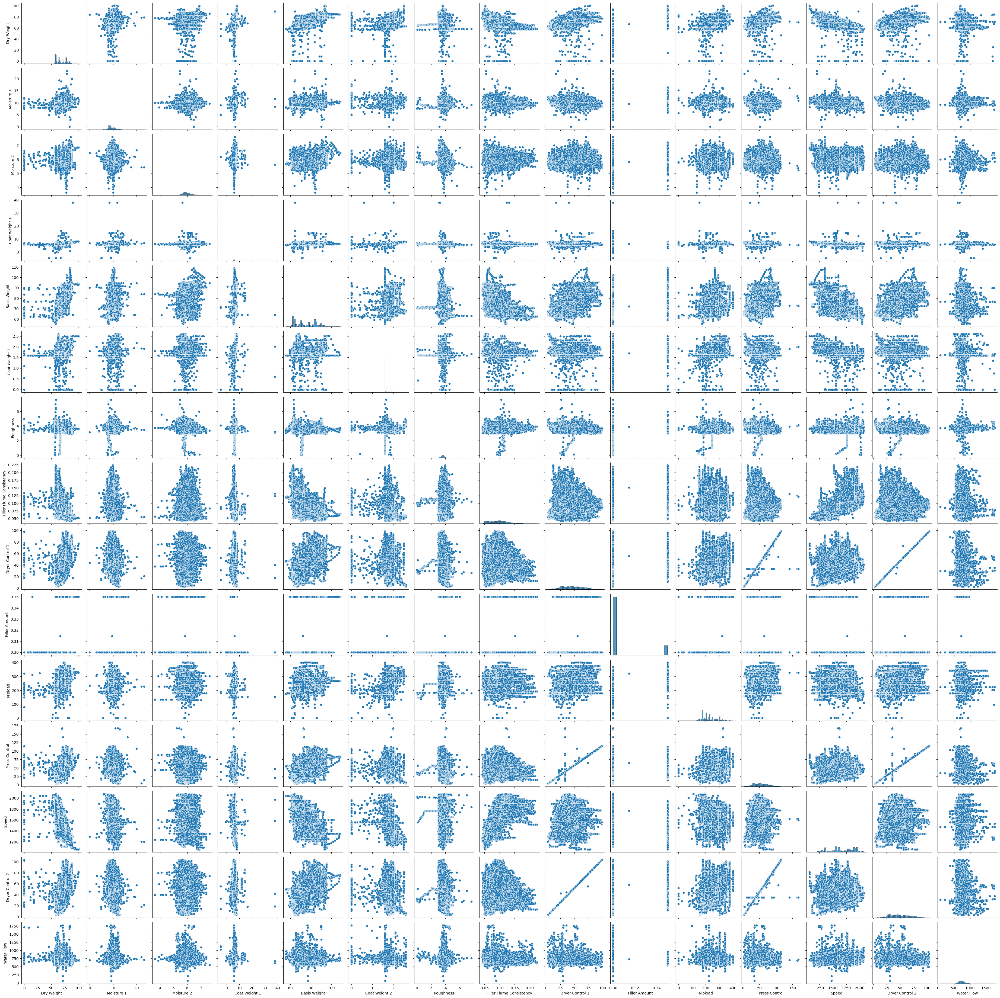

In [43]:
sns.pairplot(df2)
plt.show()

In [44]:
y2 = df2['Roughness']
X2 = df2.drop(['Roughness'], axis=1)
# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(0)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, train_size=0.7, test_size=0.3, random_state=100)

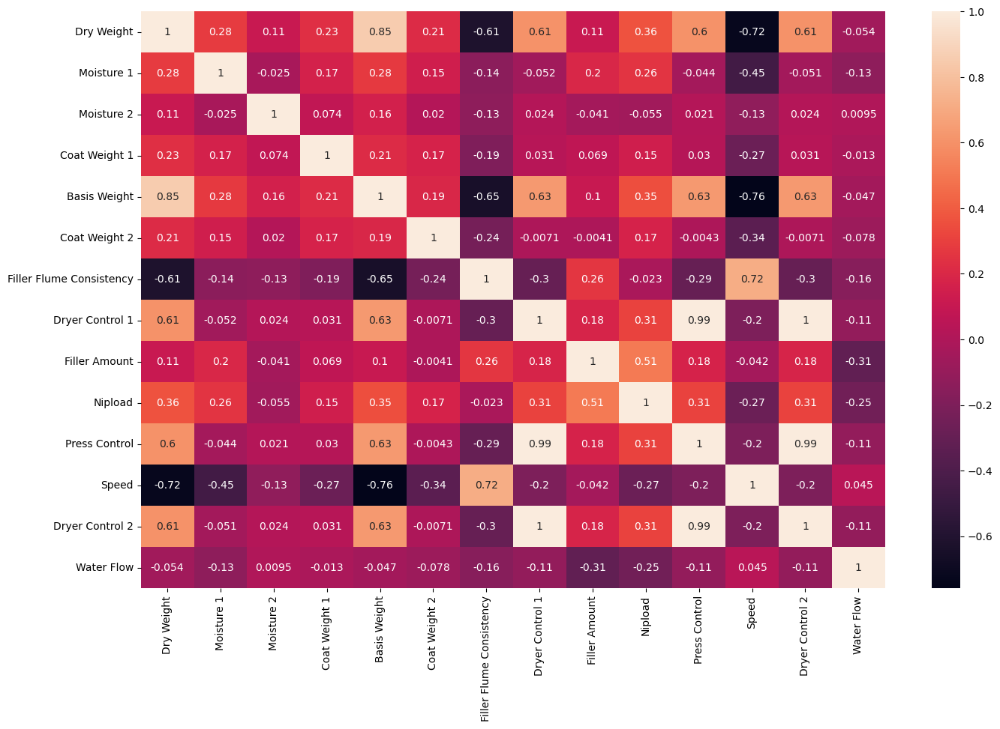

In [45]:
# Let's check the correlation coefficients to see which variables are highly correlated

plt.figure(figsize = (16, 10))
sns.heatmap(X2_train.corr(), annot = True)
plt.show()

In [46]:
X2_test = X2_test.drop(['Dryer Control 1','Filler Flume Consistency','Basis Weight','Moisture 1','Coat Weight 2'], 1)
X2_train = X2_train.drop(['Dryer Control 1','Filler Flume Consistency','Basis Weight','Moisture 1','Coat Weight 2'], 1)

In [47]:
# Create a Linear Regression model
model = LinearRegression()

# Fit the model on the training data
LR=model.fit(X2_train, y2_train)

In [48]:
from sklearn.metrics import mean_squared_error
# Make predictions on the test data
y2_pred = model.predict(X2_test)

# Evaluate the model's performance
mse = mean_squared_error(y2_test, y2_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.09603680974511912


#### there is a very little change in MSE value

In [49]:
# Get the coefficients (weights) and intercept
coefficients = model.coef_  # Coefficients for each feature
intercept = model.intercept_  # Intercept (constant term)
# Assuming X_train is a pandas DataFrame
feature_names = X2_train.columns
# Create a DataFrame for the summary table
summary_table = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Add a row for the intercept
summary_table = summary_table.append({'Feature': 'Intercept', 'Coefficient': intercept}, ignore_index=True)

# Print or display the summary table
print(summary_table)

           Feature  Coefficient
0       Dry Weight    -0.000491
1       Moisture 2    -0.100099
2    Coat Weight 1    -0.018054
3    Filler Amount    -0.118931
4          Nipload     0.000038
5    Press Control     0.001608
6            Speed     0.000043
7  Dryer Control 2    -0.004499
8       Water Flow     0.000149
9        Intercept     4.381534


Text(0, 0.5, 'y_pred')

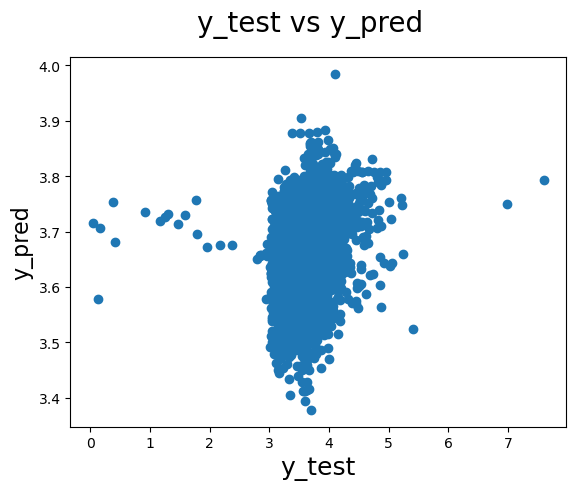

In [50]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y2_test,y2_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16) 

In [51]:
import statsmodels.api as sm

# Assuming you have X_train and y_train defined
X_train_with_const = sm.add_constant(X2_train)  # Add a constant term (intercept) to the predictor variables
model1 = sm.OLS(y2_train, X_train_with_const).fit()  # Create and fit the model

print(model1.summary())


                            OLS Regression Results                            
Dep. Variable:              Roughness   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     81.04
Date:                Fri, 15 Sep 2023   Prob (F-statistic):          6.71e-147
Time:                        09:09:59   Log-Likelihood:                -3346.8
No. Observations:               12707   AIC:                             6714.
Df Residuals:                   12697   BIC:                             6788.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               4.3815      0.102     

In [52]:
model1.params

const              4.381534
Dry Weight        -0.000491
Moisture 2        -0.100099
Coat Weight 1     -0.018054
Filler Amount     -0.118931
Nipload            0.000038
Press Control      0.001608
Speed              0.000043
Dryer Control 2   -0.004499
Water Flow         0.000149
dtype: float64


We can see that the equation of our best fitted line is:

$ price = 4.38 - 0.000491  \times  Dry Weight -0.100099  \times  Moisture 2 -0.018054 \times Coat Weight 1 -0.118931 \times Filler Amount + 0.000038 \times Nipload  + 0.001608 \times Press Control + 0.000043 \times Speed  -0.004499 \times Dryer Control 2 + 0.000149 \times Water Flow $


It is also acknowledged that it could be done better. 

We have a couple of options:
1. Add new features 
2. Build a non-linear model

### Random Forest Regression

In [59]:
df3=df2.copy() # Cleaned data from the last approach. 

In [60]:
y = df3['Roughness']
X = df3.drop(['Roughness'], axis=1)

In [61]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [63]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

# Assuming X_train and y_train are already defined
regressor = RandomForestRegressor(n_estimators=100, random_state=42)  # You can adjust the number of trees (n_estimators)

# Fit the model
regressor.fit(X_train, y_train)

# Feature importances and names
feature_importances = regressor.feature_importances_
feature_names = X_train.columns  # Assuming X_train is a pandas DataFrame

# Print feature importances along with names
print("Feature Importances:")
for feature_name, importance in zip(feature_names, feature_importances):
    print(f"{feature_name}: {importance}")

# Make predictions
y_pred = regressor.predict(X_test)

# Calculate R-squared
r_squared = r2_score(y_test, y_pred)
print(f"R-squared (Coefficient of Determination): {r_squared}")


Feature Importances:
Dry Weight: 0.08819449130798848
Moisture 1: 0.059354858925841
Moisture 2: 0.08626801956371667
Coat Weight 1: 0.06234484561726544
Basis Weight: 0.1295791787560311
Coat Weight 2: 0.05751239959615182
Filler Flume Consistency: 0.07880751532470547
Dryer Control 1: 0.03353467734832711
Filler Amount: 0.007992300674391781
Nipload: 0.1725244973233162
Press Control: 0.04020321492365112
Speed: 0.1047704383182835
Dryer Control 2: 0.039240992355231465
Water Flow: 0.03967256996509881
R-squared (Coefficient of Determination): 0.7077124525194853


In [65]:
# Mean squared error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error (MSE): {mse}")

Mean Squared Error (MSE): 0.029747467785015413


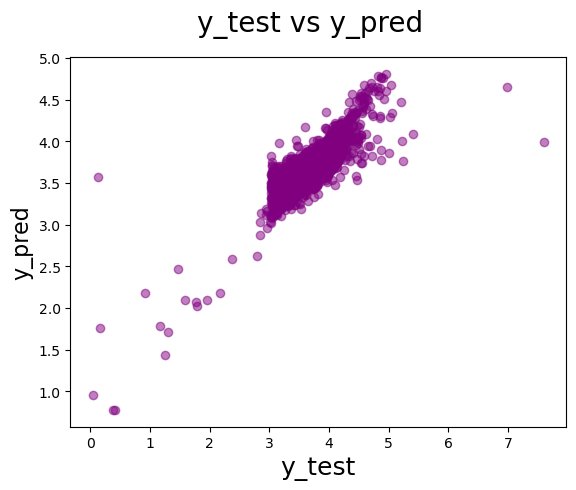

In [70]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test, y_pred, c='purple', alpha=0.5)  # Set the color to blue and adjust transparency with alpha
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)
plt.show()  # Display the plot